In [1]:
import onnx
from helper import get_pixel_data, predict


In [2]:
model = onnx.load("test.onnx")
onnx.checker.check_model(model)

In [3]:
import numpy as np
import onnxruntime

In [4]:
ort_session = onnxruntime.InferenceSession("1024_test.onnx", providers=["CPUExecutionProvider"])


In [5]:
import torch

In [6]:
np.array(torch.randn(1,1,248))

array([[[ 0.97808796, -1.1397009 , -0.48991537,  0.5585981 ,
         -0.64333516, -0.01012371, -0.720603  , -0.35202515,
         -0.7867808 , -0.7010164 ,  0.72457683, -0.8496826 ,
          0.6295488 , -0.9239334 , -0.946762  , -0.8861298 ,
         -0.32007822,  1.2823215 , -1.853277  ,  0.13578911,
         -0.21506378,  0.19874607, -1.2069824 ,  0.00834821,
         -0.27744937,  0.15889356,  0.86370355,  0.74175906,
         -1.0994788 , -0.9847743 , -1.4355377 ,  0.7400026 ,
         -2.1384432 ,  0.5594225 , -0.9847509 ,  1.0306629 ,
         -1.8634757 ,  0.01520197, -0.29928297,  1.0902655 ,
         -1.2031798 ,  0.43332595, -0.24393843,  0.21074337,
          1.4268101 ,  1.4165156 , -0.88074625, -0.8295343 ,
          0.59339786,  1.8455219 ,  0.28195927, -0.12127909,
          1.1122655 ,  1.0292226 ,  1.8369929 ,  1.1206591 ,
          0.75090784,  1.2763083 , -1.9692788 , -0.7246567 ,
         -0.23575152, -0.25881845, -0.6371681 ,  0.5137785 ,
          0.08273989,  0

In [7]:
test_dict = {'input.1': np.float32(np.random.randn(1024,1,248))}

In [8]:
test_dict

{'input.1': array([[[-2.0853028 ,  0.7979565 ,  0.04891019, ...,  0.1888644 ,
           1.534831  ,  1.2135087 ]],
 
        [[-0.20975459,  0.40811324, -1.4945493 , ..., -1.385709  ,
           0.22647585, -1.3700318 ]],
 
        [[-0.5886168 ,  1.1038048 ,  0.06448303, ..., -1.8090148 ,
          -0.6345196 , -0.05138198]],
 
        ...,
 
        [[-0.0793284 ,  0.09682442,  0.8784443 , ...,  0.40095428,
          -1.3266175 ,  0.0648616 ]],
 
        [[ 1.2827499 ,  1.2342315 , -0.08167091, ...,  0.542509  ,
          -0.9638943 ,  0.72717977]],
 
        [[ 1.0513467 , -0.6597805 ,  0.85452574, ..., -0.9919565 ,
           1.3815703 ,  1.1438658 ]]], dtype=float32)}

In [9]:
# for i in ort_session.get_inputs():
#     print(i)

In [10]:
runtime_outputs = ort_session.run(None, test_dict)

In [11]:
runtime_outputs

[array([[[0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 0.]],
 
        ...,
 
        [[0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 0.]],
 
        [[0., 0., 0., ..., 0., 0., 0.]]], dtype=float32),
 array([[0.02830019, 0.03232832, 0.02410296, ..., 0.02788349, 0.03023466,
         0.02813992],
        [0.02453101, 0.02682709, 0.02602893, ..., 0.03316354, 0.03554667,
         0.02768047],
        [0.02752227, 0.028811  , 0.02474484, ..., 0.027309  , 0.02886747,
         0.02666971],
        ...,
        [0.02648167, 0.03024333, 0.02852375, ..., 0.02474573, 0.03043734,
         0.03156335],
        [0.02827669, 0.03203792, 0.02620697, ..., 0.02583129, 0.0305866 ,
         0.03089299],
        [0.0296253 , 0.03309224, 0.02285   , ..., 0.02538451, 0.03199305,
         0.0296006 ]], dtype=float32)]

In [12]:
pixel_data_fr = get_pixel_data("/Users/ziad/Documents/GitHub/pixel_classifier/Data/frt0001eb09_07_if164l_trr3.img")

Image loaded successfully.


/Users/ziad/Documents/GitHub/n2n4m/n2n4m/preprocessing.py:263: RuntimeWarning: Mean of empty slice
  image_copy = np.nan_to_num(image_copy, nan=np.nanmean(image_copy, axis=0))
/Users/ziad/miniforge3/envs/pixel_clf_torch/lib/python3.12/site-packages/crism_ml/preprocessing.py:409: RuntimeWarning: invalid value encountered in divide
  normed = pixspec[idx, :, :] / bland


In [47]:
def split_and_pad(array):
    # Ensure the input array has the correct number of channels (248)
    if array.shape[1] != 248:
        raise ValueError("Input array must have 248 channels.")

    # Calculate the number of full blocks and the remainder
    num_full_blocks = array.shape[0] // 1024
    remainder = array.shape[0] % 1024

    # Split into full blocks
    blocks = [array[i * 1024:(i + 1) * 1024] for i in range(num_full_blocks)]

    # Handle the remainder by padding with zeros if necessary
    if remainder > 0:
        padded_block = np.zeros((1024, 248))
        padded_block[:remainder] = array[num_full_blocks * 1024:]
        blocks.append(padded_block)
        remainder_index = num_full_blocks
    else:
        remainder_index = None

    return np.array(blocks), remainder


In [48]:
input_data, remainder_indices = split_and_pad(pixel_data_fr)

In [49]:
remainder_indices

512

In [50]:
pixel_data_fr.shape

(268800, 248)

In [51]:
pixel_data_fr[:1024,:]

array([[0.        , 0.00142969, 0.00307293, ..., 0.24939984, 0.249278  ,
        0.24930936],
       [0.        , 0.00142969, 0.00307293, ..., 0.24939984, 0.249278  ,
        0.24930936],
       [0.        , 0.00142969, 0.00307293, ..., 0.24939984, 0.249278  ,
        0.24930936],
       ...,
       [0.9997493 , 0.5247345 , 0.5332861 , ..., 0.3925951 , 0.4175207 ,
        0.25559258],
       [0.81159544, 0.61561024, 0.7340873 , ..., 0.43417177, 0.41190043,
        0.27309597],
       [0.99973   , 0.8988626 , 0.9558961 , ..., 0.43675166, 0.39048713,
        0.37249705]], dtype=float32)

In [52]:
predictions = []
for i in input_data:
    predictions.append(predict(np.expand_dims(np.float32(i), 1))[1])


In [53]:
print(runtime_outputs[0].shape)

(1024, 1, 248)


In [59]:
np.array(predictions).reshape(-1, 38)[:-(1024-remainder_indices) ,:].reshape(420, 640, 38)[:,:,:]

array([[[0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536],
        [0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536],
        [0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536],
        ...,
        [0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536],
        [0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536],
        [0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536]],

       [[0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536],
        [0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536],
        [0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536],
        ...,
        [0.02862584, 0.02866415, 0.02280888, ..., 0.02821295,
         0.03047345, 0.02753536],
        [0.0

In [55]:
np.sum(np.array(predictions).reshape(-1, 38)[:268800,:].reshape(420, 640, 38)[:,:,:], axis = -1)

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], dtype=float32)

In [56]:
remainder_indices

512

In [57]:
import matplotlib.pyplot as plt

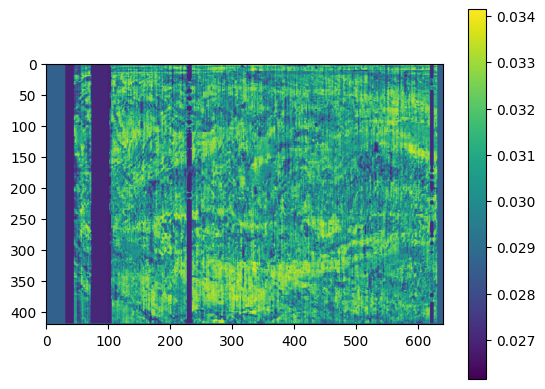

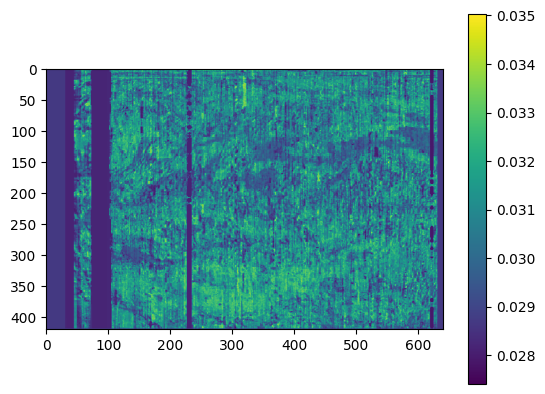

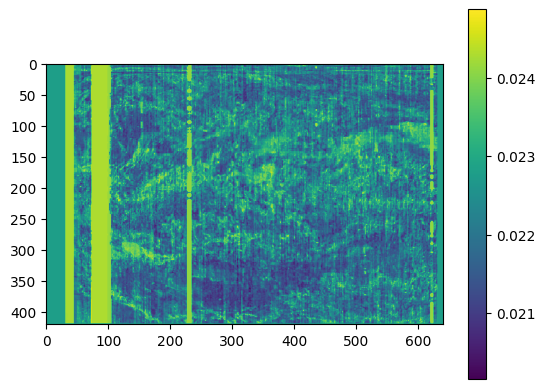

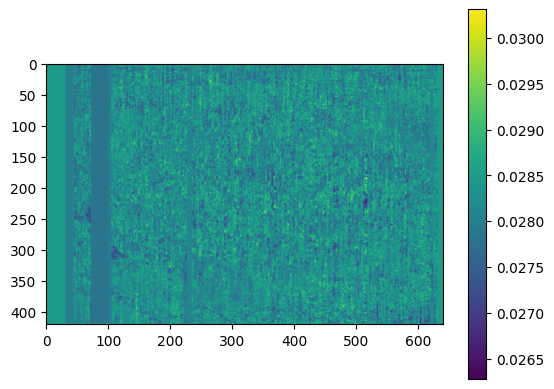

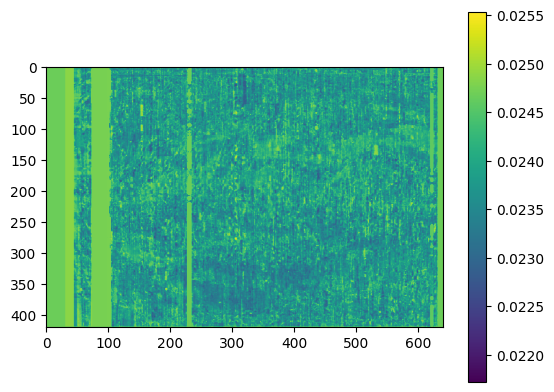

...

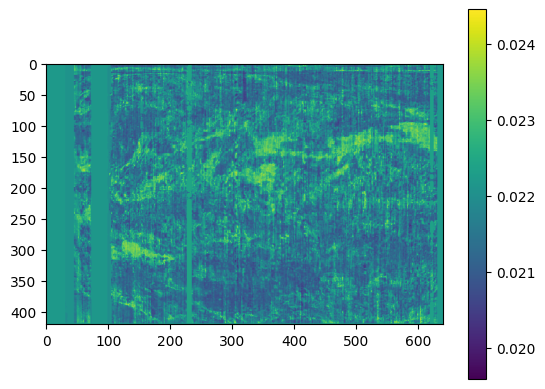

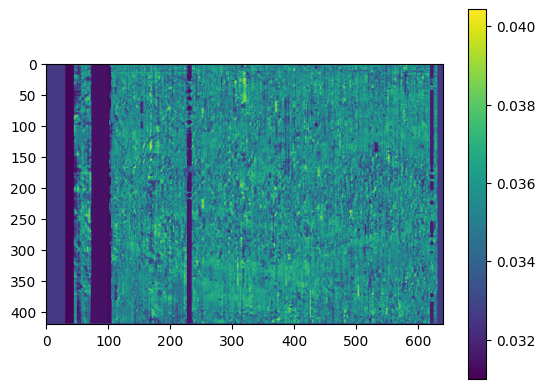

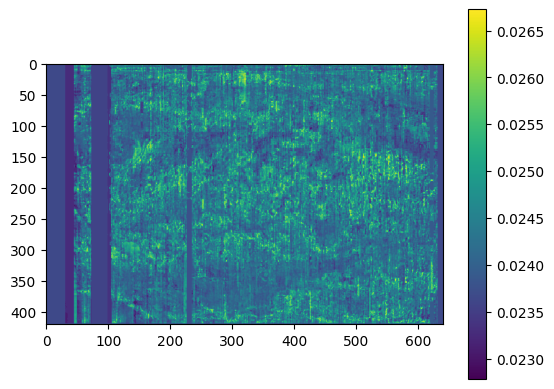

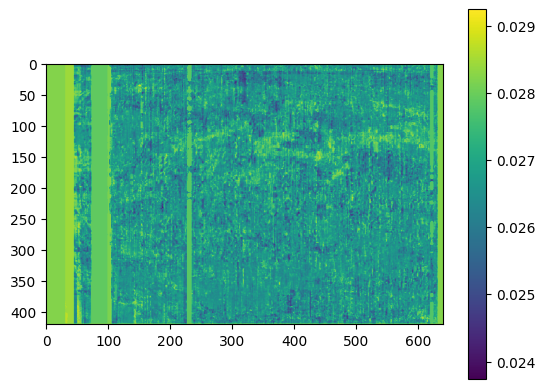

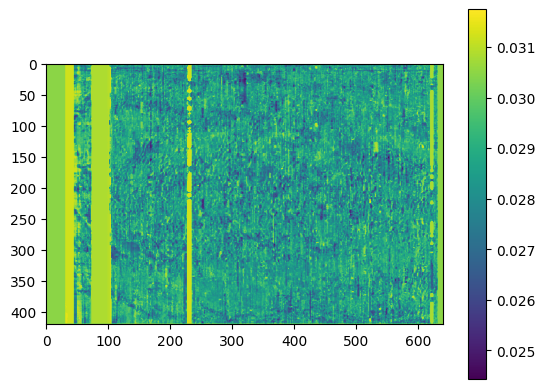

In [58]:
for i in range(37):
    plt.imshow(np.array(predictions).reshape(-1, 38)[:268800,:].reshape(420, 640, 38)[:,:,i])
    plt.colorbar()
    plt.show()

In [ ]:
np.array(predictions)